# Project 1: A Notebook "Data Story" on the history of philosophy

**Due Date**: Feburary 1, 2023 by 6pm


**Objective:** The goal of this project is to write a data story on philosophy using the dataset for the Philosophy Data Project. Applying data mining, statistical analysis and visualization, students should derive interesting findings in this collection of philosophy texts and write a "data story" that can be shared with a general audience.

   
    
## Introduction

In this assignment we will study the history of philosophy dataset and our objective is to understand how the language used in philosophical text has evolved over time. Especially how does philosphy study have been affected by outside factors such as technological advancements, major political and cultural event, gender and diversity representation, etc. 


In [ ]:
%pip install wordcloud
%pip install plotly

In [ ]:
import numpy as np
import os
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import ast

## Part 1: Word Usage Trend

In this part, we evaluate the general trend in the development of philosophy by analyzing the word usage trend and average sentence length over time. 



In [3]:
data_path = "../data/philosophy_data.csv"

data = pd.read_csv(data_path)

In [5]:
data['author'].unique()

array(['Plato', 'Aristotle', 'Locke', 'Hume', 'Berkeley', 'Spinoza',
       'Leibniz', 'Descartes', 'Malebranche', 'Russell', 'Moore',
       'Wittgenstein', 'Lewis', 'Quine', 'Popper', 'Kripke', 'Foucault',
       'Derrida', 'Deleuze', 'Merleau-Ponty', 'Husserl', 'Heidegger',
       'Kant', 'Fichte', 'Hegel', 'Marx', 'Lenin', 'Smith', 'Ricardo',
       'Keynes', 'Epictetus', 'Marcus Aurelius', 'Nietzsche',
       'Wollstonecraft', 'Beauvoir', 'Davis'], dtype=object)

In [6]:
data.head()

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea..."
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ..."


In [162]:
# compute sentence length of different philosophers

df = data.groupby(data['author'])['original_publication_date'].mean().sort_values()
authors = list(dict(df))

author_by_time = pd.DataFrame(authors, columns=["authors"])

sent_len_by_author = data.groupby(data["author"])["sentence_length"].mean()
author_by_time["sent_len"] = list(sent_len_by_author[authors])

px.line(author_by_time, x="authors", y="sent_len", title="Average sentence length over time")

In [65]:
fig = px.box(data, x="sentence_length", y="author", 
             width=600, height=800, 
             title="Sentence length of Philosophers Writings")
fig.show()

### Part 2. Gender Representation in history

How has the role of women in philosophy changed throughout history? Are philosophers more aware of gender issues in modern times? Does this change correspond in time with gender movement in history? We explore these questions in this part.

In [124]:
gender_words = {"woman", "female", "lady", "girl", "madam", "feminism", "gender", 
                "patriarchy", "sex", "sexism"}

In [134]:
df = data.groupby(data['author'])['original_publication_date'].mean().sort_values()
authors = list(dict(df))

author_by_time = pd.DataFrame(authors, columns=["authors"])
author_by_time["gender_word_count"] = 0

for i, author in enumerate(authors):
    author_word = data[data["author"] == author]["tokenized_txt"]
    
    for tokens in author_word:
        tokens_ls = ast.literal_eval(tokens)
        if gender_words & set(tokens_ls):
            author_by_time.at[i, "gender_word_count"] += 1

In [161]:
log_author_by_time = author_by_time.copy()
log_author_by_time["gender_word_count"] = [0 if x == 0 else np.log2(x) for x in log_author_by_time["gender_word_count"]]
px.line(log_author_by_time, x="authors", y="gender_word_count", title="Gender term frequency over time")

This plot of gender term frequency reflects how has the role of women in philosophy changed throughout history. Ancient Greek philosophers such as Plato and Aristotle appear to have discussed gender-related issues more than their subsequent philosophers did in following millennia. Not until 20th centry Wittgenstein, Marx, and Nietzsche brounght gender issue back to public sight. And feminist philosopher Beauvoir has peaked among all other philosophers on mentioning this issue. For later philosophers, we can observe they are more aware of gender issue in their writing, as evidenced by an increasing amount of gender term frequency. 

In [163]:
from nltk.corpus import stopwords

stopwords_manual = {"one", "two", "thing", "things", "would", "say", "said", "must", "something", 
                    "make", "way", "good", "think", "man", "also", "like", "us", "come", "may","another",
                   "part", "parts", "case", "either"}
stopwords = set(stopwords.words('english'))
stopwords = stopwords | stopwords_manual

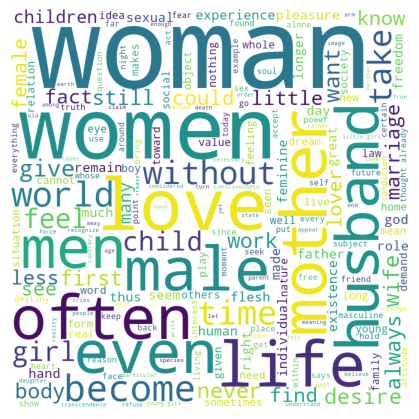

In [169]:
# word cloud
author_text = data[data["author"] == "Beauvoir"]

author_words = ""

# iterate through tokenized text
for tokens in author_text["tokenized_txt"]:
    tokens_ls = ast.literal_eval(tokens)
    author_words += " ".join(tokens_ls)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(author_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (4, 4), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

This word cloud indicates how the work of philosopher Beauvoir has focused on gender issue and feminism.

### Part 3. Political influence on philosophy

One of the most famous philosopher who writes about political opionions is Marx, so we start by analyzing his writing and see how politics is involved there.

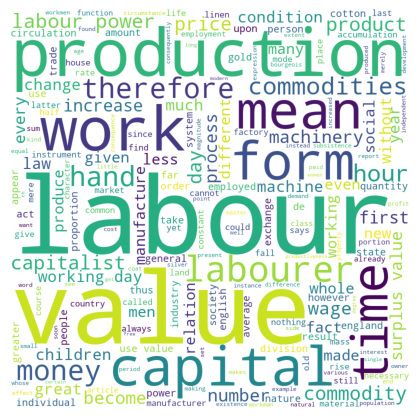

In [170]:
# word cloud
author_text = data[data["author"] == "Marx"]

author_words = ""

# iterate through tokenized text
for tokens in author_text["tokenized_txt"]:
    tokens_ls = ast.literal_eval(tokens)
    author_words += " ".join(tokens_ls)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(author_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (4, 4), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [172]:
political_words = {"politics", "political", "public", "government", "labour", "capital", "capitalism", "price", "product", 
                   "money", "communism", "state", "ownership"}

In [173]:
df = data.groupby(data['author'])['original_publication_date'].mean().sort_values()
authors = list(dict(df))

author_by_time = pd.DataFrame(authors, columns=["authors"])
author_by_time["political_word_count"] = 0

for i, author in enumerate(authors):
    author_word = data[data["author"] == author]["tokenized_txt"]
    
    for tokens in author_word:
        tokens_ls = ast.literal_eval(tokens)
        if political_words & set(tokens_ls):
            author_by_time.at[i, "political_word_count"] += 1

In [177]:
px.line(author_by_time, x="authors", y="political_word_count", title="Political term frequency over time")

We can observe that ancient Greek philosophers have briefly talked about politics (perhaps when talking about their ideal community and society model). Then politics fall out of flaver for a long time, until Adam Smith brings capitalism back to philosophy, and talk about the relationship between labor and captial. The third peak is when Hegel and Marx brings the idea of Communism into philosophy. Both of these correponds to social events of capitalist/communist revolution.